# Further Ideas: GAN that generates images similar to flower dataset
To test the versatility of our created MNIST GAN, we wanted to see its performance on a more complex task. We decided to experiment with full color images of an actual object and chose flowers as our theme.

| Teammember |                    |
|------------|--------------------|
| 1.         | Nadine Weber       |
| 2.         | Patrick Singer     |


For the dataset we used the Kaggle dataset “Flower Color Images” (https://www.kaggle.com/datasets/olgabelitskaya/flower-color-images) We chose this dataset because it incorporated many different flower types while always having the blossom in the center of the image. 

### First Version
In our first attempt, we wanted to see the performance of the original GAN created for the MNIST dataset with the more complex task of generating flower images. We changed the models to input and output 3 channel images. We also increased the resolution of the images to 46x46, to be able to recognise them even better. <br>
The first problem we encountered was that the generator would collapse at a random point in the training and only generate images of a single color. We tested different hyperparameters and found that lowering the batch size and the generator learning rate worked in our case. The model was able to generate images resembling flowers. However the images were very blurry. We assumed that this was due to the small amount of layers in the generator model.


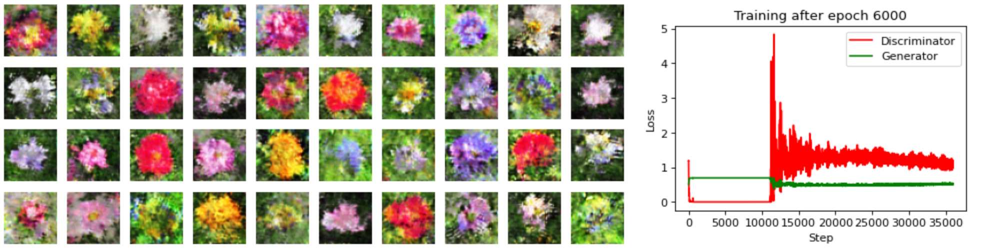

### Second Version
In our second attempt we added another convolutional layer to the generator in order to attempt to improve the clarity of the image. The added layer was similar to previous layers with a  3x3 filter and a stride of 2 with an up sampling of the image beforehand. To reduce the amount of trainable parameters we reduced the amount of filters the layer has depending on the position in the model. We thought, that the later layers in the model needed fewer filters as there would be not so many different high level shapes to learn. The updated model can be seen in the picture below on the right. With the addition of another layer is was even more difficult to balance the hyperparameter of our model for it to not collapse to a single color output. We had many different attempts that looked ok at first but eventually collapsed to a single color. In the end we had to drastically increase the learning rate of the generator to 0.001 and decrease the learning rate of the discriminator to 0.000005. The result was unfortunately not better in clarity to the first attempt and in addition to that the model had experienced mode collapse to a single flower type.

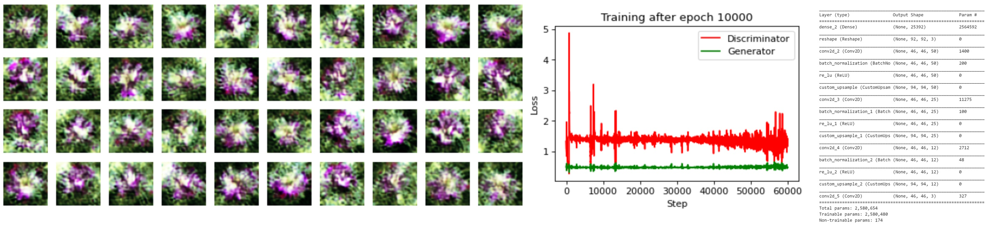

### Third Version
In our third iteration we tried different combinations of hyperparameters to be able to increase the training rate of the discriminator again, because we assumed that the really slow learning rate of the discriminator contributed to the unchanged image quality. In the end we discovered that increasing the batch size to 200 and skipping pretraining entirely allowed us to change the learning rates to more reasonable levels (generator = 0.0001 and discriminator = 0.00001). The model still collapsed to 2 types of flowers. Interestingly it chose different flowers this time. But in our opinion, the images were significantly better that the previous modes as one can see much more detail especially in the orange flowers it generates.

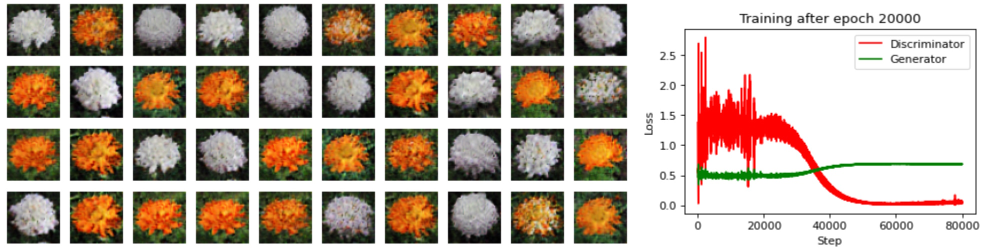

### Fourth Version
In the fourth version we tried to also increase the layer count of the discriminator. Our assumption was that we needed more layers in the discriminator for it to be able to recognize small differences in the images that would make the flowers more clear. Another convolutional layer was added to the discriminator with a filter size of 5 and an average pooling thereafter to reduce the dimensions towards the output of the model. The updated discriminator model can be seen in the image below on the right. In the end our assumption did not turn out to be true as the images became even more blurry with a still present mode collapse of the model. Because of the result we decided to reverse the expansion of the discriminator.

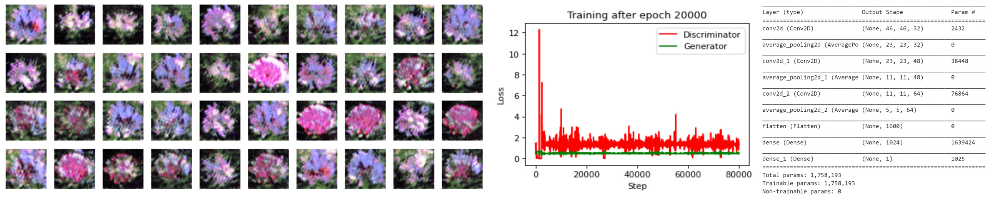

Other configurations with more layers in the generator were tried but they always resulted In a complete collapse of the output image. We learned that choosing good hyperparameters becomes increasingly difficult the more layers the model has. <br> <br>
Another aspect we looked at was the size of the training data. Our initial dataset was relatively small with only 800 images. We expanded the dataset with images of others from Kaggle.com. Our problem was that most datasets were showing flowers from different distances but we wanted to have the blossom of the flower to be in focus, so we had to manually add images that fit our criteria. However this also didn't improve the output of the image nor prevent the mode collapse of the generator.


### Conclusion

In conclusion, the GAN we created for the MNIST dataset was able to generate blurry images that represented flowers. In its original state we expected the model to perform worse than it did and were surprised that the generated flowers were recognizable and resembled realistic colors.
By experimenting with the hyperparameters and adding more layers to the generator we were able to increase the quality of the images a little bit. However all our expanded models were suffering from mode collapse and hyperparameter finetuning was very tricky. Most attempts resulted in a single color image. <br> 
A possible solution for the mode collapse could be to try a Wasserstein GAN (WGAN) on the dataset. Sadly we didn't have enough time to try this as the flower GANs took much longer to train than with the MNIST dataset. <br> In the end we didnt accieve our goal of generating realistic looking flower images. We assume that this task would require much more expertise in the field of GANs in regards to layer architecture and hyperparameter selection. Regardles it was an interesting experiment that expanded our knowledge of GANs.

### Code for Version 3
Shown below is our code for version 3 of our flower GAN. Other versions look similar so we will not show all of them to avoid repitition.
The structure mostly resembles our original GAN for the MNIST dataset. We will therefore only write comments where changes were made. Because the results of this version were already described in the summary above, they will not be analyzed again at the training output part of this notebook.

In [1]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import random
from datetime import datetime
import os
import time
from PIL import Image

%matplotlib inline

print(f"Tensorflow version: {tf.__version__} | Keras version: {keras.__version__}")
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2023-04-07 14:38:56.534716: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


Tensorflow version: 2.4.1 | Keras version: 2.4.0
Num GPUs Available:  1


2023-04-07 14:38:58.726261: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-04-07 14:38:58.727499: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-04-07 14:38:58.754266: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-04-07 14:38:58.754295: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-04-07 14:38:58.756464: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-04-07 14:38:58.756500: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2023-

Original dataset: max val = 255 | min val = 0
Normalized dataset: max val = 1.0 | min val = 0.0


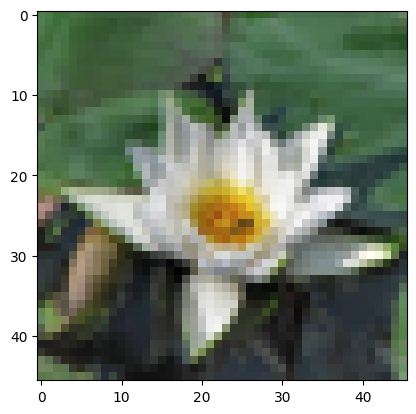

In [2]:
# Load Flower Dataset
img_dir = "./datasets/flowers"
train_x = np.empty((len(os.listdir(img_dir)), 46, 46, 3), dtype=np.uint8)

for i, img_file in enumerate(os.listdir(img_dir)):
    img_path = os.path.join(img_dir, img_file)
    img = Image.open(img_path).convert("RGB").resize((46, 46))
    train_x[i] = np.array(img)

plt.imshow(train_x[0])
    
# Normalize dataset
train_x_norm = train_x/255
print(f"Original dataset: max val = {np.max(train_x)} | min val = {np.min(train_x)}")
print(f"Normalized dataset: max val = {np.max(train_x_norm)} | min val = {np.min(train_x_norm)}")

# Show one example image
plt.imshow(train_x[random.randint(0,len(train_x))]);

In [3]:
# Reshaping dataset (Conv2D wants input = (batch_size, height, width, channels))
x_train_reshaped = tf.convert_to_tensor(train_x_norm)
print(f"Dataset shape: {x_train_reshaped.shape}")

Dataset shape: (813, 46, 46, 3)


2023-04-07 14:39:00.151307: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-07 14:39:00.152143: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-04-07 14:39:00.153360: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-04-07 14:39:00.153388: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-04-07 14:39:00.153410: I tensorflow/stream_executor/platform/default/ds

<font color="blue"><b>Comment:</b></font> The discriminator model was changed to support 3 channels for the input image. The alpha parameter of the LeakyRELU activations was also changed from 0.2 to 0.01 as this resulted in more stable images.

In [4]:
def build_discriminator():
    model = keras.Sequential([
        keras.layers.Conv2D(input_shape=(46, 46, 3), filters=32, kernel_size=5, padding="same", activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2)),
        keras.layers.Conv2D(filters=64, kernel_size=5, padding="same", activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2)),
        keras.layers.Flatten(),
        keras.layers.Dense(units=1024, activation=keras.layers.LeakyReLU(alpha=0.01)),
        keras.layers.Dense(units=1, activation="sigmoid")
    ])
    
    return model

In [5]:
test_discriminator_model = build_discriminator()
test_discriminator_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 32)        2432      
_________________________________________________________________
average_pooling2d (AveragePo (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 23, 23, 64)        51264     
_________________________________________________________________
average_pooling2d_1 (Average (None, 11, 11, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 7744)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              7930880   
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 1

**Testing model with sample image**

In [6]:
print(test_discriminator_model.predict(x_train_reshaped[0:1]))

2023-04-07 14:39:00.811416: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-04-07 14:39:00.811953: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3198120000 Hz
2023-04-07 14:39:00.876993: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-04-07 14:39:01.004732: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2023-04-07 14:39:01.506705: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2023-04-07 14:39:01.545683: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


[[0.53031707]]


In [7]:
from tensorflow.keras.layers import Layer

class CustomUpsample(Layer):
    def __init__(self, size=(2, 2), **kwargs):
        super().__init__(**kwargs)
        self.size = size
    
    def call(self, inputs):
        return tf.image.resize(inputs, size=self.size, method=tf.image.ResizeMethod.BILINEAR)

<font color="blue"><b>Comment:</b></font> The generator was expanded with another convolutional layer and outputs an image with 3 channels (RGB).

In [8]:
def build_generator(n, output_dim=46):
    l = ((output_dim*2)**2)*3
    
    model = keras.Sequential([
        keras.layers.Dense(input_shape=(n,), units=l, activation="relu"),
        keras.layers.Reshape((output_dim*2, output_dim*2, 3), input_shape=(l,)),
        keras.layers.Conv2D(filters=int(n/2), kernel_size=3, strides=(2, 2), padding="same"),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=int(n/4), kernel_size=3, strides=(2, 2)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=int(n/8), kernel_size=3, strides=(2, 2)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        CustomUpsample((output_dim*2+2, output_dim*2+2)),
        keras.layers.Conv2D(filters=3, kernel_size=3, strides=(2, 2), activation="sigmoid")      
    ])
    
    return model

In [9]:
test_generator_model = build_generator(100, output_dim=46)
test_generator_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 25392)             2564592   
_________________________________________________________________
reshape (Reshape)            (None, 92, 92, 3)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 46, 46, 50)        1400      
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 50)        200       
_________________________________________________________________
re_lu (ReLU)                 (None, 46, 46, 50)        0         
_________________________________________________________________
custom_upsample (CustomUpsam (None, 94, 94, 50)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 46, 46, 25)       

**Testing model with sample noise**

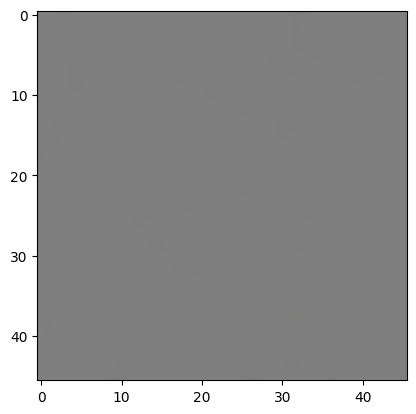

In [10]:
test_out = test_generator_model.predict(([random.random() for _ in range(100)],))
plt.imshow((test_out*255).astype('uint8').squeeze());

In [11]:
@tf.function
def binary_cross_entropy(y_true, y_pred, from_logits=True):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=from_logits)
    loss = bce(y_true, y_pred)
    return loss

@tf.function
def calc_discriminator_loss(real_output, fake_output):
    real_output_loss = binary_cross_entropy(tf.ones_like(real_output), real_output, from_logits=False)
    fake_output_loss = binary_cross_entropy(tf.zeros_like(fake_output), fake_output, from_logits=False)
    
    total_loss = real_output_loss + fake_output_loss
    return tf.reduce_mean(total_loss)

@tf.function
def calc_generator_loss(fake_output):
    g_loss = binary_cross_entropy(tf.ones_like(fake_output), fake_output)
    return g_loss

In [12]:
def create_log_folder():
    current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = os.path.join("./tensorboard/flowers", current_time)

    if not os.path.exists(log_dir):
        os.makedirs(log_dir)

    file_writer = tf.summary.create_file_writer(log_dir)
    
    return file_writer, log_dir

In [13]:
# Show images of a batch
def show_imgs_of_batch(image_batch):
    fig = plt.figure()

    for i in range(len(image_batch)):
        fig.add_subplot(1, len(image_batch), i+1)
        plt.imshow(image_batch[i], cmap="gray")
        plt.axis('off')
    plt.show()

In [14]:
def pretrain_step(image_batch, generator_model, discriminator_model, discriminator_optimizer, noise_vector_length=100, show_details=False):
    image_batch = tf.convert_to_tensor(image_batch)   
    
    if show_details:
        show_imgs_of_batch(image_batch)
    
    # Generate fake images
    noise = tf.random.normal([len(image_batch), noise_vector_length])
    fake_img_batch = generator_model(noise, training=False)
    
    if show_details:
        show_imgs_of_batch(fake_img_batch)
    
    # Loss
    with tf.GradientTape(persistent=True) as tape:
        real_img_predictions = discriminator_model(image_batch, training=True)   
        fake_img_predictions = discriminator_model(fake_img_batch, training=True)
        
        if show_details:
            print(f"Real predictions:\n{real_img_predictions}\n"
                  f"Fake predictions:\n{fake_img_predictions}")
        
        loss = calc_discriminator_loss(real_img_predictions, fake_img_predictions)
        
        if show_details:
            print(f"Loss: {loss}")

    # Get gradients
    gradients = tape.gradient(loss, discriminator_model.trainable_variables)
    
    # Apply gradients to weights in model
    discriminator_optimizer.apply_gradients(zip(gradients, discriminator_model.trainable_variables))

    return {"loss": loss.numpy(), 
            "real_img_confidence": tf.reduce_mean(real_img_predictions).numpy(),
            "fake_img_confidence": tf.reduce_mean(fake_img_predictions).numpy()}

In [15]:
def pretraining(batch_size, steps, generator_model, discriminator_model, discriminator_optimizer, train_data=x_train_reshaped):
    step_results = []
    fig = plt.figure(dpi=80)
    batches = [train_data[x:x+batch_size] for x in range(0, len(train_data),batch_size)]
    if len(batches) > steps:
        batches = batches[:steps]
    
    for batch_imgs in batches:
        step_result = pretrain_step(batch_imgs, generator_model, discriminator_model, discriminator_optimizer, show_details=False)
        step_results.append(step_result)
    
    # Plot
    fig.add_subplot(2, 1, 1)
    
    plt.plot([val["loss"] for val in step_results], "b")
    plt.title("Discriminator Pretraining")
    plt.ylabel("Loss")
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    
    fig.add_subplot(2, 1, 2)
    plt.plot([val["real_img_confidence"] for val in step_results], "g", label="Real Images")
    plt.plot([val["fake_img_confidence"] for val in step_results], "r", label="Fake Images")
    plt.xlabel("Step")
    plt.ylabel("Confidence") 
    plt.legend()
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    
    plt.show()

In [16]:
def train_step(image_batch, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, noise_vector_length=100, show_details=False):
    image_batch = tf.convert_to_tensor(image_batch)   
    
    # Loss
    with tf.GradientTape(persistent=True) as tape:
        # Generate fake images
        noise = tf.random.normal([len(image_batch), noise_vector_length])
        fake_img_batch = generator_model(noise, training=False)
        
        # Discriminator prediction for real and fakes
        real_img_predictions = discriminator_model(image_batch, training=True)   
        fake_img_predictions = discriminator_model(fake_img_batch, training=True)
        
        # Losses for both models
        dis_loss = calc_discriminator_loss(real_img_predictions, fake_img_predictions)
        gen_loss = calc_generator_loss(fake_img_predictions)
        
        if show_details:
            print(f"Discriminator Loss: {dis_loss}")
            print(f"Generator Loss: {gen_loss}")
            print(len(fake_img_batch))
            show_imgs_of_batch(fake_img_batch[0:5])
        
    # Get gradients
    dis_gradients = tape.gradient(dis_loss, discriminator_model.trainable_variables)
    gen_gradients = tape.gradient(gen_loss, generator_model.trainable_variables)

    # Apply gradients to weights in model
    discriminator_optimizer.apply_gradients(zip(dis_gradients, discriminator_model.trainable_weights))
    generator_optimizer.apply_gradients(zip(gen_gradients, generator_model.trainable_variables))
    
    return {"discriminator_loss": dis_loss.numpy(),
            "generator_loss": gen_loss.numpy(),
            "sample_images": fake_img_batch[:4]}

In [17]:
def training(batch_size, epochs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, train_data=x_train_reshaped, plot_every_x_epochs=10, file_writer=None):
    step_results_list = []
    total_trained_on_images = 0
    total_weight_adjustments = 0
    start_time = time.time()
    
    for epoch in range(1, epochs+1):
        
        # Shuffle new batches
        tf.random.shuffle(train_data)
        batches = [train_data[x:x+batch_size] for x in range(0, len(train_data),batch_size)]
        if len(batches[-1]) != batch_size:
            batches = batches[:-1]
        
        # Train one epoch 
        for batch_imgs in batches:
            step_results = train_step(batch_imgs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer)
            step_results_list.append({"discriminator_loss": step_results["discriminator_loss"], "generator_loss": step_results["generator_loss"]})
            
            total_trained_on_images += len(batch_imgs)
            total_weight_adjustments += 1
            
            # Write to file every 10 steps as described in the task
            if total_weight_adjustments % 10 == 0 and file_writer != None:
                with file_writer.as_default():
                    tf.summary.scalar("generator_loss", step_results['generator_loss'], step=total_weight_adjustments)
                    tf.summary.scalar("discriminator_loss", step_results['discriminator_loss'], step=total_weight_adjustments)
                    for i in range(1, len(step_results["sample_images"])):
                        tf.summary.image(f"sample_img_{i}", step_results["sample_images"][i-1:i], step=total_weight_adjustments)
            
            # Assign trained model instances to global variable (In case training needs to be resumed later) 
            global saved_generator_model, saved_discriminator_model, saved_discriminator_optimizer, saved_generator_optimizer
            saved_generator_model, saved_discriminator_model, saved_discriminator_optimizer, saved_generator_optimizer = generator_model, discriminator_model, discriminator_optimizer, generator_optimizer
            
        # Summary
        if epoch % plot_every_x_epochs == 0 or epoch == 1:
                        
            # Print summary
            print(f"Summary after epoch {epoch}\n" +"="*(20+len(str(epoch))))
            print(f"Training progress: {round((epoch/epochs)*100)}%")
            print(f"Time elapsed: {round(time.time() - start_time)} seconds")
            print(f"Current Discriminator Loss: {str(step_results['discriminator_loss'])[:5]}")
            print(f"Current Generator Loss: {str(step_results['generator_loss'])[:5]}")
            print(f"Total trained on images: {total_trained_on_images}")
            print(f"Total weight adjustments: {total_weight_adjustments}")
            
            # Plot summary
            fig = plt.figure(figsize=(8, 3), dpi=80)
            gs = fig.add_gridspec(2,5)
            
            ax1 = fig.add_subplot(gs[:, 0:3])
            ax1.plot([val["discriminator_loss"] for val in step_results_list], "r", label="Discriminator")
            ax1.plot([val["generator_loss"] for val in step_results_list], "g", label="Generator")
            ax1.set_title(f"Training after epoch {epoch}")
            ax1.set_xlabel("Step")
            ax1.set_ylabel("Loss")
            ax1.legend()
            
            ax2 = fig.add_subplot(gs[0, 3])
            ax2.imshow(step_results["sample_images"][0], cmap="gray")
            ax2.axis('off')
            ax3 = fig.add_subplot(gs[1, 3])          
            ax3.imshow(step_results["sample_images"][1], cmap="gray")
            ax3.axis('off')
            ax4 = fig.add_subplot(gs[0, 4])
            ax4.imshow(step_results["sample_images"][2], cmap="gray")
            ax4.axis('off')
            ax5 = fig.add_subplot(gs[1, 4])          
            ax5.imshow(step_results["sample_images"][3], cmap="gray")
            ax5.axis('off')

            plt.show()

<font color="blue"><b>Comment:</b></font> Because of the smaller dataset the output of the plot and sample images was increased from every 10 epochs to every 100 epochs.

In [18]:
def complete_training(generator_learn_rate, discriminator_learn_rate, batch_size, pretraining_steps, training_epochs, create_new_models=True, open_tensorboard=False):
    
    # Initialization
    if create_new_models:
        # New models
        generator_model = build_generator(100)
        discriminator_model = build_discriminator()
        # Optimizers
        generator_optimizer = tf.keras.optimizers.Adam(generator_learn_rate)
        discriminator_optimizer = tf.keras.optimizers.Adam(discriminator_learn_rate)
        # Compile models
        discriminator_model.compile(loss=calc_discriminator_loss, optimizer=discriminator_optimizer)
        generator_model.compile(loss=calc_generator_loss, optimizer=generator_optimizer)
        print(">> Created new Models")
    else:
        # Load saved models
        try:
            generator_model = saved_generator_model
            discriminator_model = saved_discriminator_model
            discriminator_optimizer = saved_discriminator_optimizer
            generator_optimizer = saved_generator_optimizer
            print(">> Loaded saved Models")
        except NameError:
            print(">> No saved Models found")
            return
        
    # Create log folder
    file_writer, log_dir = create_log_folder()
    
    # Training
    if pretraining_steps > 0:
        print(">> Beginning Pretraining")
        pretrain_start_time = time.time()
        pretraining(batch_size, pretraining_steps, generator_model, discriminator_model, discriminator_optimizer, train_data=x_train_reshaped)
        print(f">> Finished Pretraining after {round(time.time() - pretrain_start_time)} seconds")
    else:
        print(">> Skipping Pretraining")
    
    print(">> Beginning Training\n")
    train_start_time = time.time()
    training(batch_size, training_epochs, generator_model, discriminator_model, discriminator_optimizer, generator_optimizer, plot_every_x_epochs=100, file_writer=file_writer)
    print(f">> Finished Training after {round(time.time() - train_start_time)} seconds")
    
    if open_tensorboard:
        print(f">> Opening Tensorboard")
        !tensorboard --logdir={log_dir}
    
    return generator_model

Summary after epoch 13500
Training progress: 68%
Time elapsed: 9954 seconds
Current Discriminator Loss: 0.024
Current Generator Loss: 0.686
Total trained on images: 10800000
Total weight adjustments: 54000


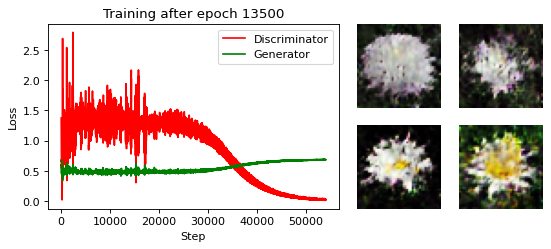

Summary after epoch 13600
Training progress: 68%
Time elapsed: 10028 seconds
Current Discriminator Loss: 0.022
Current Generator Loss: 0.685
Total trained on images: 10880000
Total weight adjustments: 54400


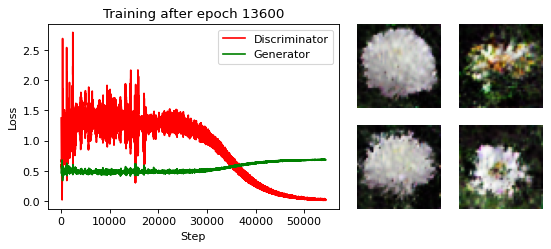

Summary after epoch 13700
Training progress: 68%
Time elapsed: 10103 seconds
Current Discriminator Loss: 0.018
Current Generator Loss: 0.687
Total trained on images: 10960000
Total weight adjustments: 54800


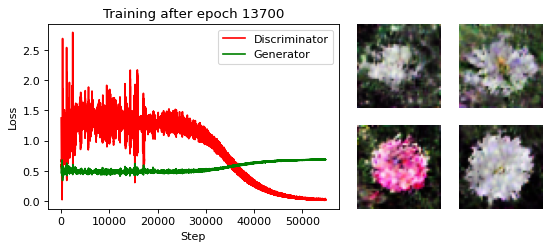

Summary after epoch 13800
Training progress: 69%
Time elapsed: 10177 seconds
Current Discriminator Loss: 0.021
Current Generator Loss: 0.685
Total trained on images: 11040000
Total weight adjustments: 55200


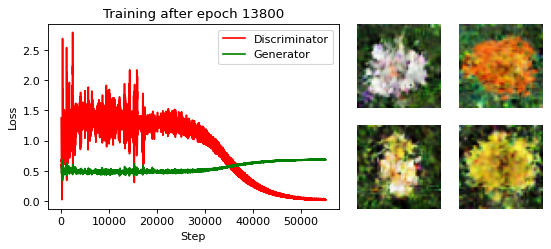

Summary after epoch 13900
Training progress: 70%
Time elapsed: 10251 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.688
Total trained on images: 11120000
Total weight adjustments: 55600


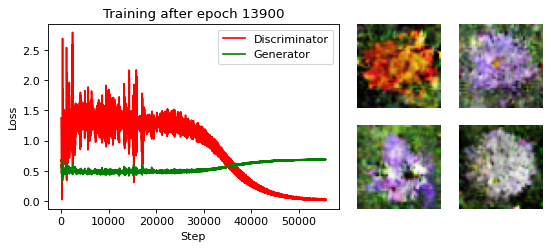

Summary after epoch 14000
Training progress: 70%
Time elapsed: 10326 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.688
Total trained on images: 11200000
Total weight adjustments: 56000


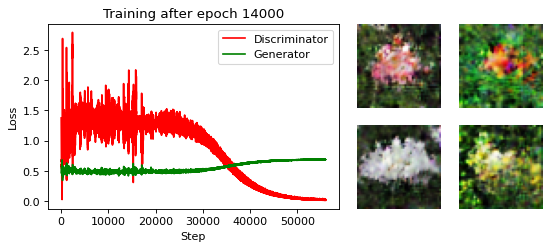

Summary after epoch 14100
Training progress: 70%
Time elapsed: 10400 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.689
Total trained on images: 11280000
Total weight adjustments: 56400


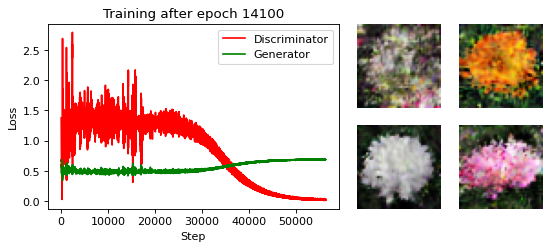

Summary after epoch 14200
Training progress: 71%
Time elapsed: 10474 seconds
Current Discriminator Loss: 0.015
Current Generator Loss: 0.688
Total trained on images: 11360000
Total weight adjustments: 56800


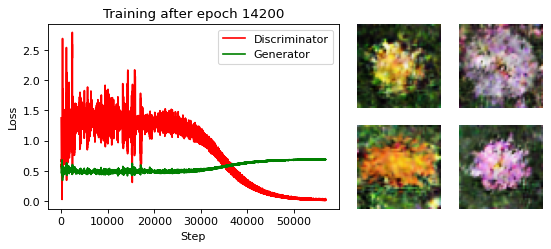

Summary after epoch 14300
Training progress: 72%
Time elapsed: 10548 seconds
Current Discriminator Loss: 0.013
Current Generator Loss: 0.689
Total trained on images: 11440000
Total weight adjustments: 57200


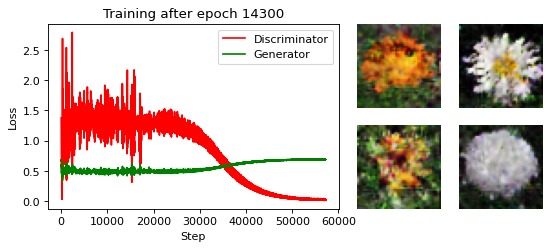

Summary after epoch 14400
Training progress: 72%
Time elapsed: 10623 seconds
Current Discriminator Loss: 0.016
Current Generator Loss: 0.687
Total trained on images: 11520000
Total weight adjustments: 57600


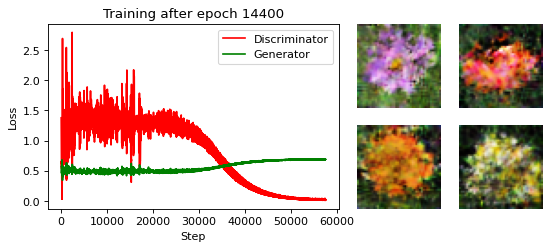

Summary after epoch 14500
Training progress: 72%
Time elapsed: 10697 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.689
Total trained on images: 11600000
Total weight adjustments: 58000


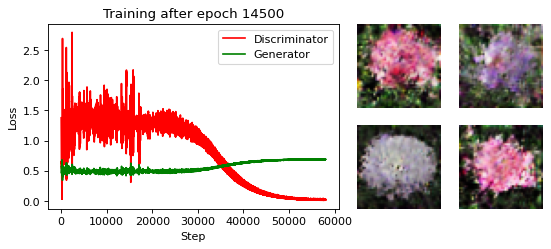

Summary after epoch 14600
Training progress: 73%
Time elapsed: 10771 seconds
Current Discriminator Loss: 0.013
Current Generator Loss: 0.689
Total trained on images: 11680000
Total weight adjustments: 58400


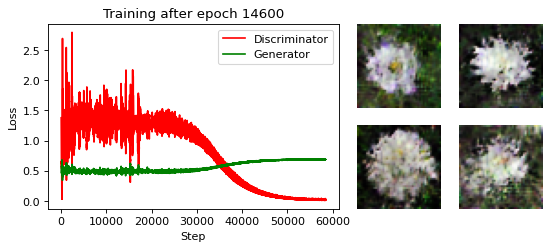

Summary after epoch 14700
Training progress: 74%
Time elapsed: 10845 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.688
Total trained on images: 11760000
Total weight adjustments: 58800


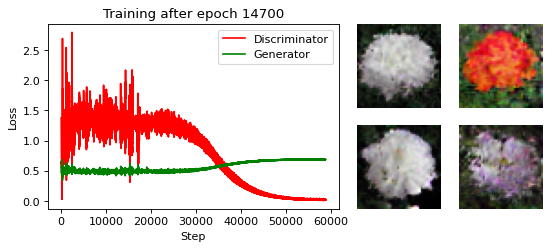

Summary after epoch 14800
Training progress: 74%
Time elapsed: 10919 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.686
Total trained on images: 11840000
Total weight adjustments: 59200


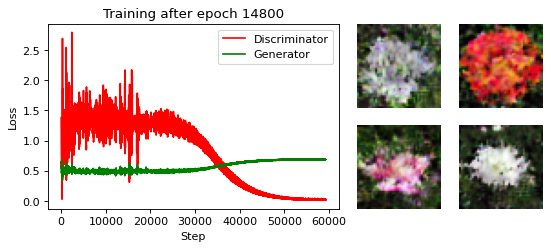

Summary after epoch 14900
Training progress: 74%
Time elapsed: 10993 seconds
Current Discriminator Loss: 0.010
Current Generator Loss: 0.690
Total trained on images: 11920000
Total weight adjustments: 59600


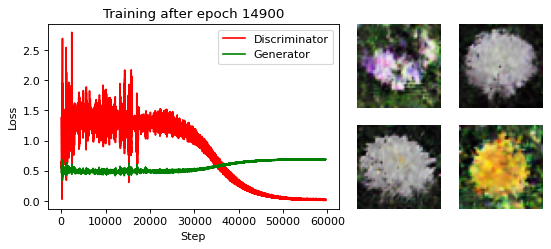

Summary after epoch 15000
Training progress: 75%
Time elapsed: 11067 seconds
Current Discriminator Loss: 0.012
Current Generator Loss: 0.690
Total trained on images: 12000000
Total weight adjustments: 60000


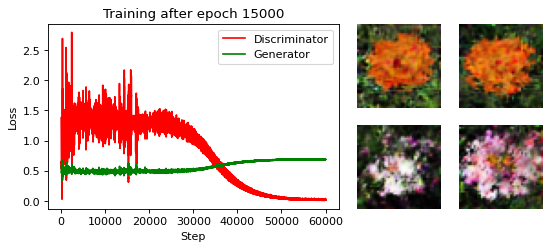

Summary after epoch 15100
Training progress: 76%
Time elapsed: 11141 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.690
Total trained on images: 12080000
Total weight adjustments: 60400


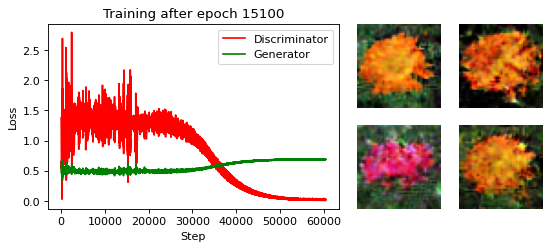

Summary after epoch 15200
Training progress: 76%
Time elapsed: 11215 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.690
Total trained on images: 12160000
Total weight adjustments: 60800


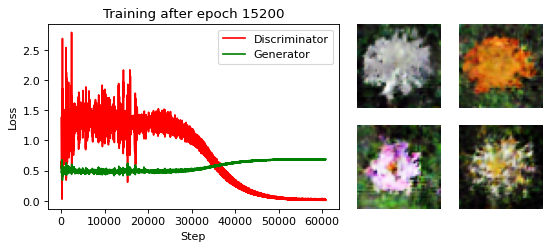

Summary after epoch 15300
Training progress: 76%
Time elapsed: 11289 seconds
Current Discriminator Loss: 0.013
Current Generator Loss: 0.689
Total trained on images: 12240000
Total weight adjustments: 61200


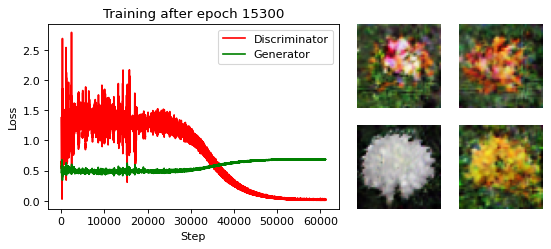

Summary after epoch 15400
Training progress: 77%
Time elapsed: 11363 seconds
Current Discriminator Loss: 0.012
Current Generator Loss: 0.691
Total trained on images: 12320000
Total weight adjustments: 61600


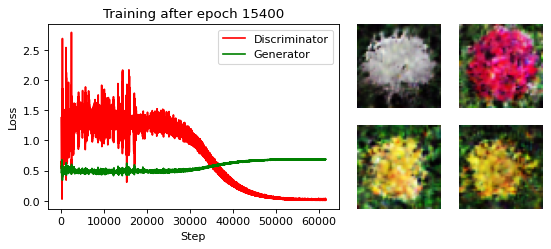

Summary after epoch 15500
Training progress: 78%
Time elapsed: 11437 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.689
Total trained on images: 12400000
Total weight adjustments: 62000


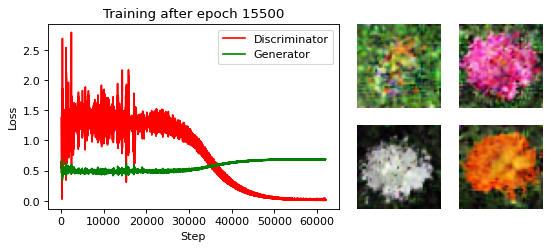

Summary after epoch 15600
Training progress: 78%
Time elapsed: 11511 seconds
Current Discriminator Loss: 0.011
Current Generator Loss: 0.689
Total trained on images: 12480000
Total weight adjustments: 62400


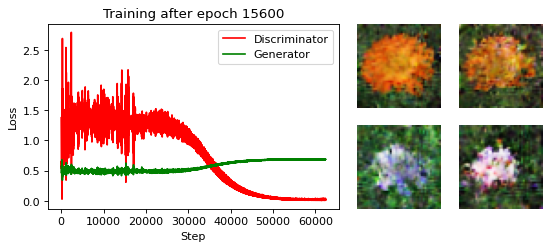

Summary after epoch 15700
Training progress: 78%
Time elapsed: 11585 seconds
Current Discriminator Loss: 0.018
Current Generator Loss: 0.687
Total trained on images: 12560000
Total weight adjustments: 62800


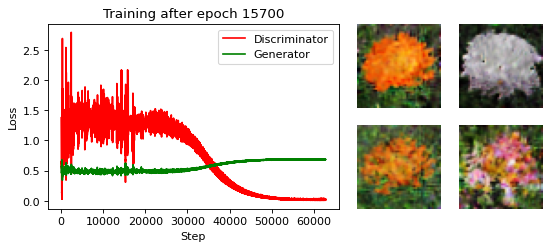

Summary after epoch 15800
Training progress: 79%
Time elapsed: 11660 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.688
Total trained on images: 12640000
Total weight adjustments: 63200


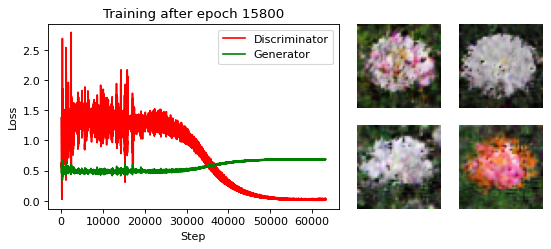

Summary after epoch 15900
Training progress: 80%
Time elapsed: 11734 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.689
Total trained on images: 12720000
Total weight adjustments: 63600


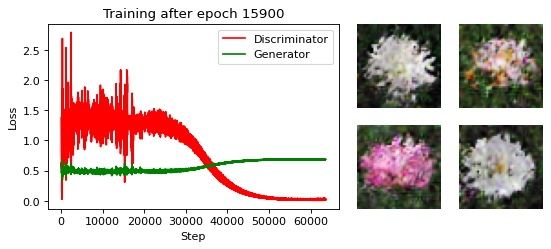

Summary after epoch 16000
Training progress: 80%
Time elapsed: 11808 seconds
Current Discriminator Loss: 0.016
Current Generator Loss: 0.689
Total trained on images: 12800000
Total weight adjustments: 64000


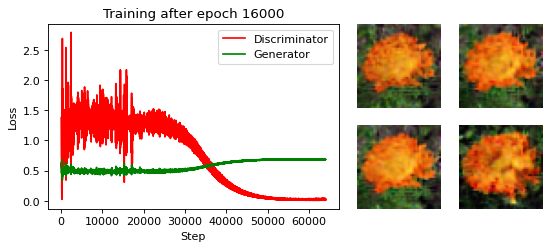

Summary after epoch 16100
Training progress: 80%
Time elapsed: 11883 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.686
Total trained on images: 12880000
Total weight adjustments: 64400


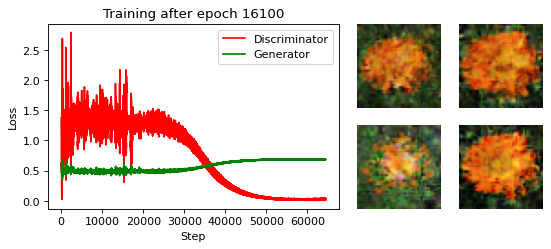

Summary after epoch 16200
Training progress: 81%
Time elapsed: 11957 seconds
Current Discriminator Loss: 0.027
Current Generator Loss: 0.682
Total trained on images: 12960000
Total weight adjustments: 64800


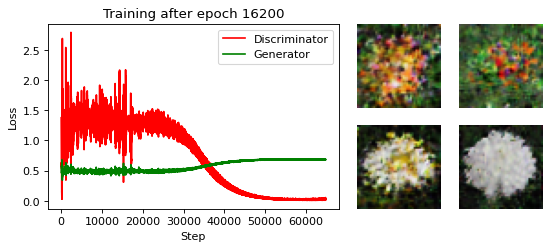

Summary after epoch 16300
Training progress: 82%
Time elapsed: 12031 seconds
Current Discriminator Loss: 0.014
Current Generator Loss: 0.690
Total trained on images: 13040000
Total weight adjustments: 65200


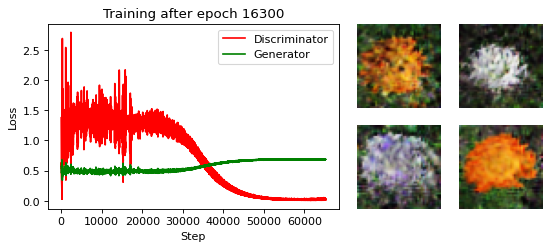

Summary after epoch 16400
Training progress: 82%
Time elapsed: 12105 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.689
Total trained on images: 13120000
Total weight adjustments: 65600


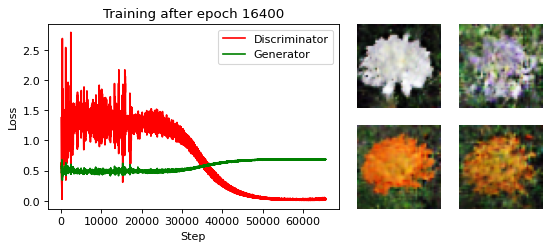

Summary after epoch 16500
Training progress: 82%
Time elapsed: 12179 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.687
Total trained on images: 13200000
Total weight adjustments: 66000


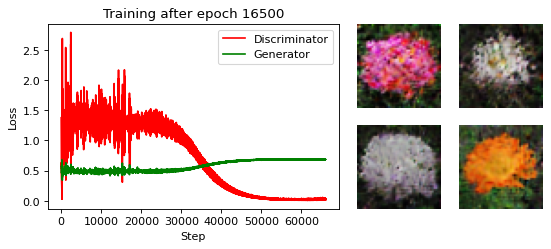

Summary after epoch 16600
Training progress: 83%
Time elapsed: 12254 seconds
Current Discriminator Loss: 0.017
Current Generator Loss: 0.689
Total trained on images: 13280000
Total weight adjustments: 66400


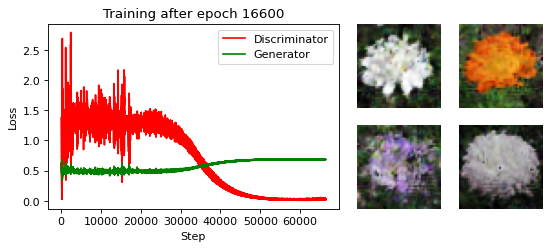

Summary after epoch 16700
Training progress: 84%
Time elapsed: 12328 seconds
Current Discriminator Loss: 0.025
Current Generator Loss: 0.684
Total trained on images: 13360000
Total weight adjustments: 66800


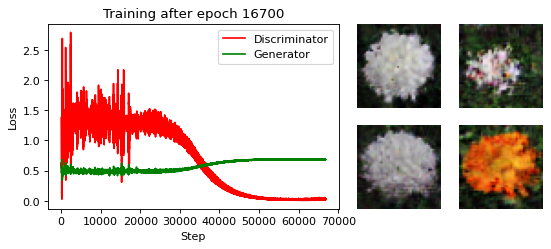

Summary after epoch 16800
Training progress: 84%
Time elapsed: 12403 seconds
Current Discriminator Loss: 0.018
Current Generator Loss: 0.689
Total trained on images: 13440000
Total weight adjustments: 67200


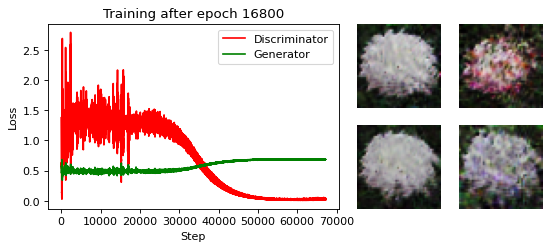

Summary after epoch 16900
Training progress: 84%
Time elapsed: 12477 seconds
Current Discriminator Loss: 0.021
Current Generator Loss: 0.687
Total trained on images: 13520000
Total weight adjustments: 67600


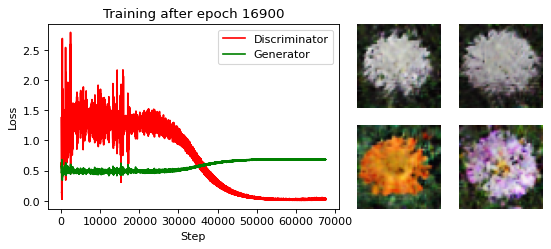

Summary after epoch 17000
Training progress: 85%
Time elapsed: 12551 seconds
Current Discriminator Loss: 0.019
Current Generator Loss: 0.688
Total trained on images: 13600000
Total weight adjustments: 68000


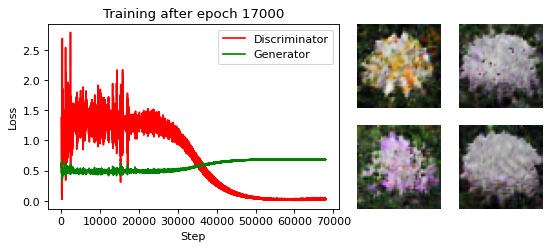

Summary after epoch 17100
Training progress: 86%
Time elapsed: 12626 seconds
Current Discriminator Loss: 0.021
Current Generator Loss: 0.687
Total trained on images: 13680000
Total weight adjustments: 68400


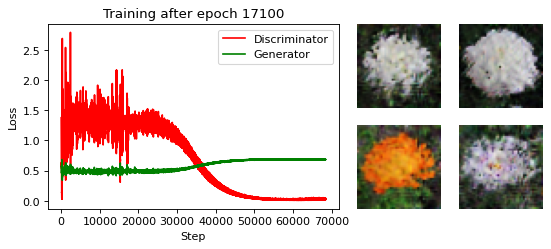

Summary after epoch 17200
Training progress: 86%
Time elapsed: 12700 seconds
Current Discriminator Loss: 0.022
Current Generator Loss: 0.686
Total trained on images: 13760000
Total weight adjustments: 68800


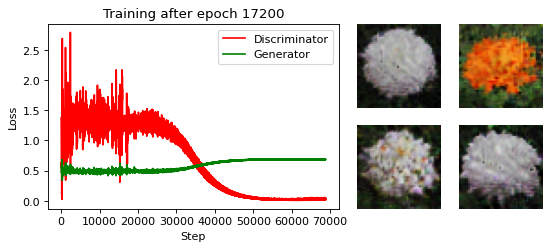

Summary after epoch 17300
Training progress: 86%
Time elapsed: 12775 seconds
Current Discriminator Loss: 0.021
Current Generator Loss: 0.687
Total trained on images: 13840000
Total weight adjustments: 69200


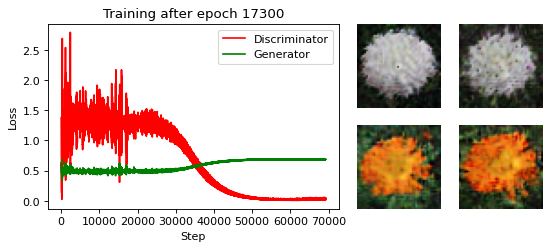

Summary after epoch 17400
Training progress: 87%
Time elapsed: 12849 seconds
Current Discriminator Loss: 0.027
Current Generator Loss: 0.684
Total trained on images: 13920000
Total weight adjustments: 69600


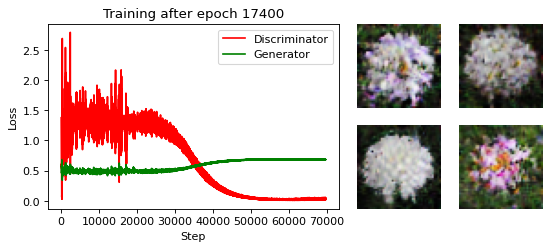

Summary after epoch 17500
Training progress: 88%
Time elapsed: 12924 seconds
Current Discriminator Loss: 0.023
Current Generator Loss: 0.687
Total trained on images: 14000000
Total weight adjustments: 70000


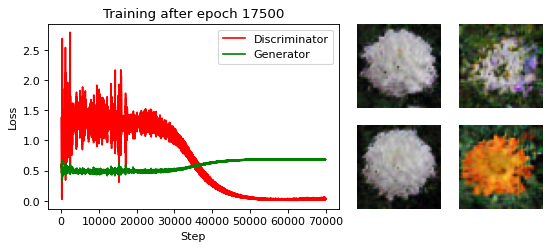

Summary after epoch 17600
Training progress: 88%
Time elapsed: 12998 seconds
Current Discriminator Loss: 0.028
Current Generator Loss: 0.685
Total trained on images: 14080000
Total weight adjustments: 70400


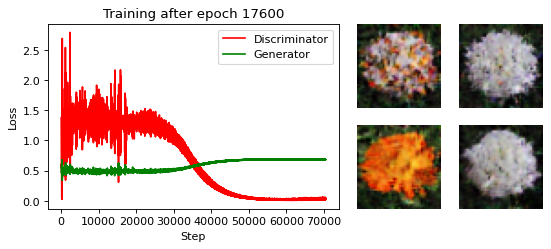

Summary after epoch 17700
Training progress: 88%
Time elapsed: 13072 seconds
Current Discriminator Loss: 0.021
Current Generator Loss: 0.687
Total trained on images: 14160000
Total weight adjustments: 70800


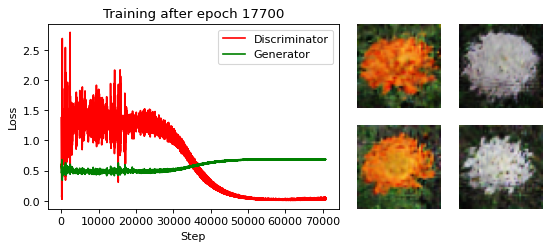

Summary after epoch 17800
Training progress: 89%
Time elapsed: 13147 seconds
Current Discriminator Loss: 0.023
Current Generator Loss: 0.686
Total trained on images: 14240000
Total weight adjustments: 71200


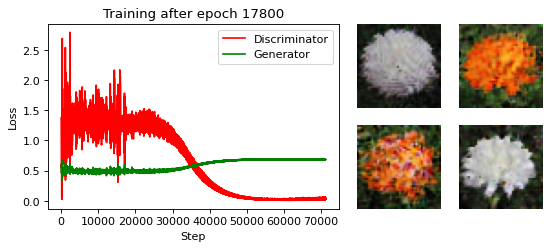

Summary after epoch 17900
Training progress: 90%
Time elapsed: 13221 seconds
Current Discriminator Loss: 0.022
Current Generator Loss: 0.688
Total trained on images: 14320000
Total weight adjustments: 71600


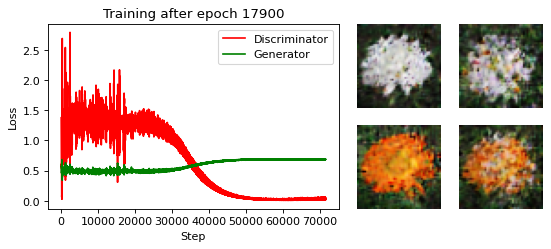

Summary after epoch 18000
Training progress: 90%
Time elapsed: 13296 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.684
Total trained on images: 14400000
Total weight adjustments: 72000


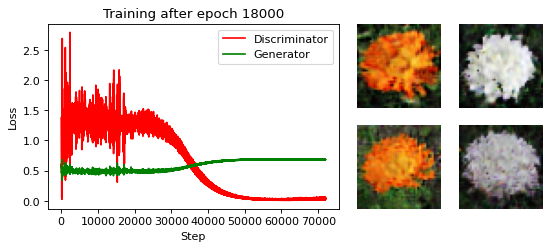

Summary after epoch 18100
Training progress: 90%
Time elapsed: 13370 seconds
Current Discriminator Loss: 0.024
Current Generator Loss: 0.687
Total trained on images: 14480000
Total weight adjustments: 72400


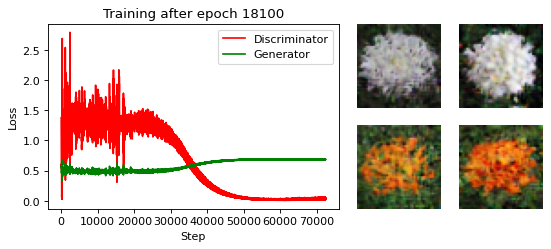

Summary after epoch 18200
Training progress: 91%
Time elapsed: 13445 seconds
Current Discriminator Loss: 0.030
Current Generator Loss: 0.684
Total trained on images: 14560000
Total weight adjustments: 72800


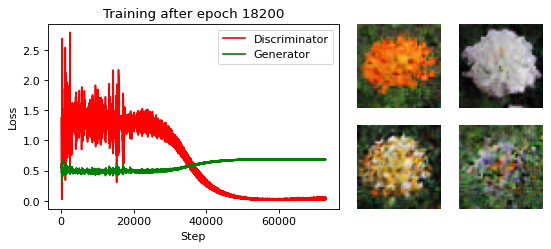

Summary after epoch 18300
Training progress: 92%
Time elapsed: 13520 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.685
Total trained on images: 14640000
Total weight adjustments: 73200


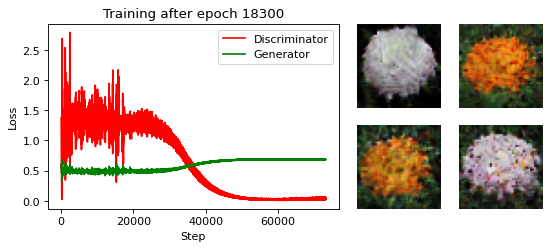

Summary after epoch 18400
Training progress: 92%
Time elapsed: 13594 seconds
Current Discriminator Loss: 0.034
Current Generator Loss: 0.683
Total trained on images: 14720000
Total weight adjustments: 73600


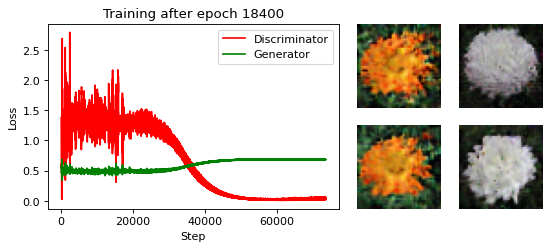

Summary after epoch 18500
Training progress: 92%
Time elapsed: 13668 seconds
Current Discriminator Loss: 0.025
Current Generator Loss: 0.686
Total trained on images: 14800000
Total weight adjustments: 74000


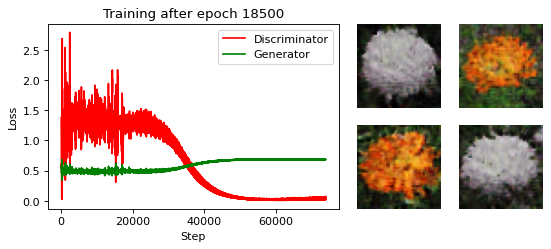

Summary after epoch 18600
Training progress: 93%
Time elapsed: 13742 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.686
Total trained on images: 14880000
Total weight adjustments: 74400


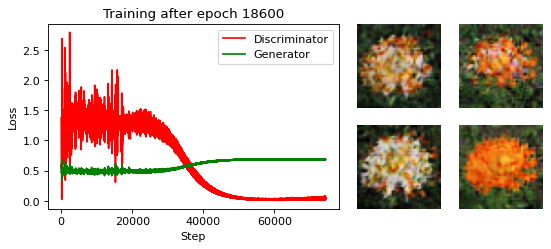

Summary after epoch 18700
Training progress: 94%
Time elapsed: 13815 seconds
Current Discriminator Loss: 0.028
Current Generator Loss: 0.687
Total trained on images: 14960000
Total weight adjustments: 74800


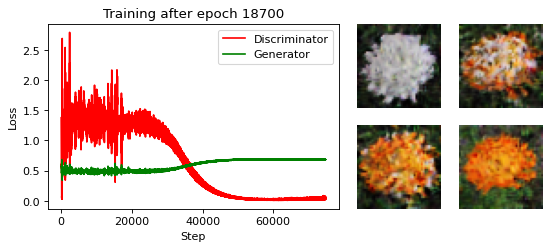

Summary after epoch 18800
Training progress: 94%
Time elapsed: 13889 seconds
Current Discriminator Loss: 0.027
Current Generator Loss: 0.688
Total trained on images: 15040000
Total weight adjustments: 75200


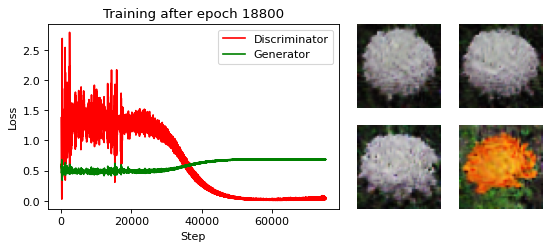

Summary after epoch 18900
Training progress: 94%
Time elapsed: 13964 seconds
Current Discriminator Loss: 0.032
Current Generator Loss: 0.684
Total trained on images: 15120000
Total weight adjustments: 75600


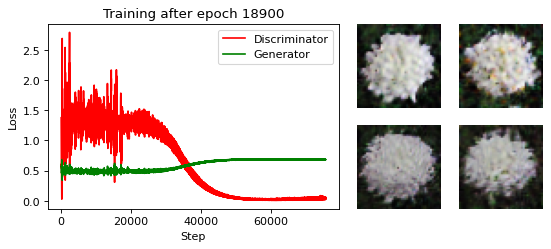

Summary after epoch 19000
Training progress: 95%
Time elapsed: 14038 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.686
Total trained on images: 15200000
Total weight adjustments: 76000


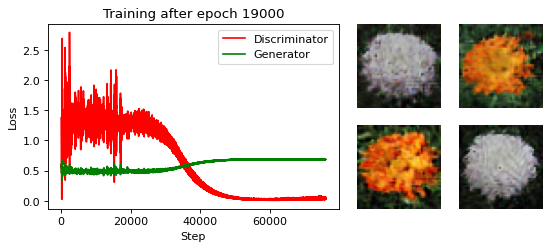

Summary after epoch 19100
Training progress: 96%
Time elapsed: 14112 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.685
Total trained on images: 15280000
Total weight adjustments: 76400


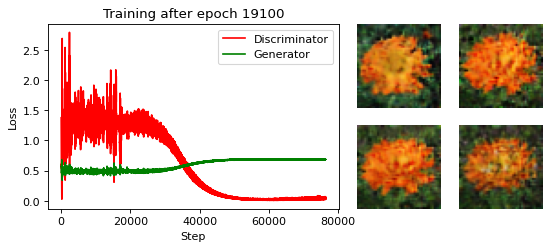

Summary after epoch 19200
Training progress: 96%
Time elapsed: 14187 seconds
Current Discriminator Loss: 0.030
Current Generator Loss: 0.685
Total trained on images: 15360000
Total weight adjustments: 76800


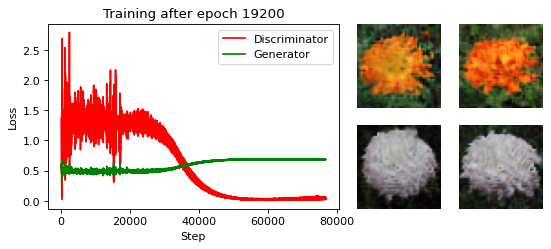

Summary after epoch 19300
Training progress: 96%
Time elapsed: 14261 seconds
Current Discriminator Loss: 0.028
Current Generator Loss: 0.685
Total trained on images: 15440000
Total weight adjustments: 77200


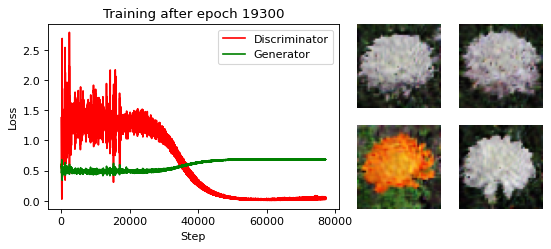

Summary after epoch 19400
Training progress: 97%
Time elapsed: 14335 seconds
Current Discriminator Loss: 0.028
Current Generator Loss: 0.688
Total trained on images: 15520000
Total weight adjustments: 77600


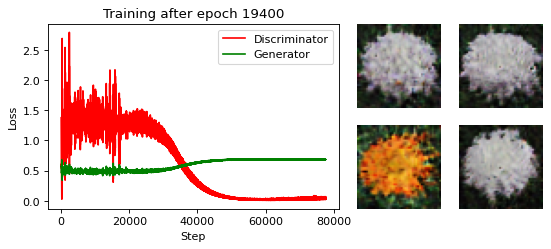

Summary after epoch 19500
Training progress: 98%
Time elapsed: 14410 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.683
Total trained on images: 15600000
Total weight adjustments: 78000


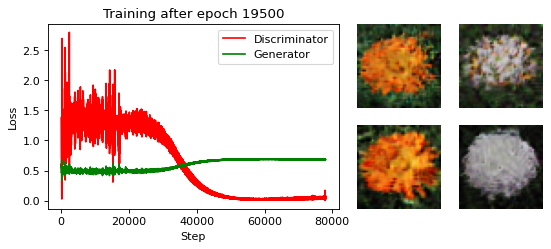

Summary after epoch 19600
Training progress: 98%
Time elapsed: 14484 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.686
Total trained on images: 15680000
Total weight adjustments: 78400


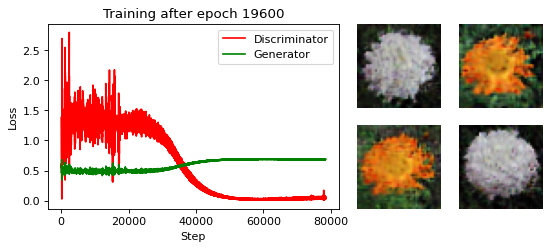

Summary after epoch 19700
Training progress: 98%
Time elapsed: 14558 seconds
Current Discriminator Loss: 0.032
Current Generator Loss: 0.684
Total trained on images: 15760000
Total weight adjustments: 78800


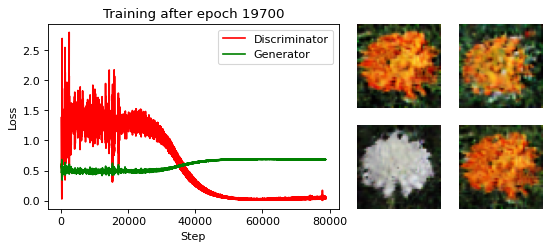

Summary after epoch 19800
Training progress: 99%
Time elapsed: 14632 seconds
Current Discriminator Loss: 0.041
Current Generator Loss: 0.680
Total trained on images: 15840000
Total weight adjustments: 79200


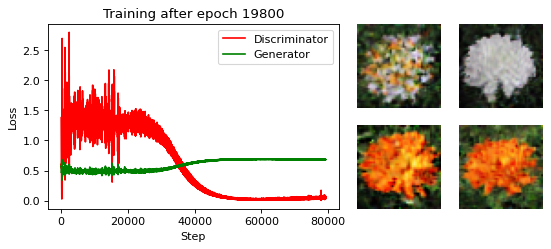

Summary after epoch 19900
Training progress: 100%
Time elapsed: 14707 seconds
Current Discriminator Loss: 0.039
Current Generator Loss: 0.683
Total trained on images: 15920000
Total weight adjustments: 79600


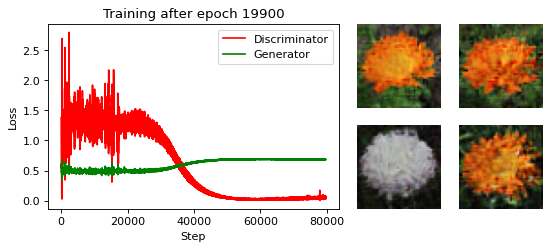

Summary after epoch 20000
Training progress: 100%
Time elapsed: 14781 seconds
Current Discriminator Loss: 0.029
Current Generator Loss: 0.686
Total trained on images: 16000000
Total weight adjustments: 80000


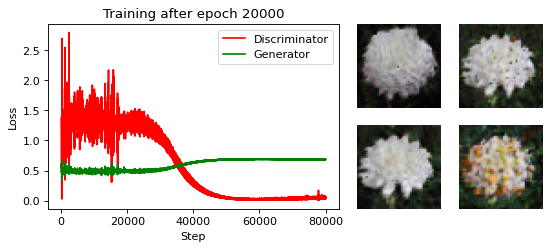

>> Finished Training after 14782 seconds


In [19]:
generator_model = complete_training(generator_learn_rate=0.0001, 
                                    discriminator_learn_rate=0.00001, 
                                    batch_size=200,
                                    pretraining_steps=0, 
                                    training_epochs=20000,
                                    create_new_models=True)

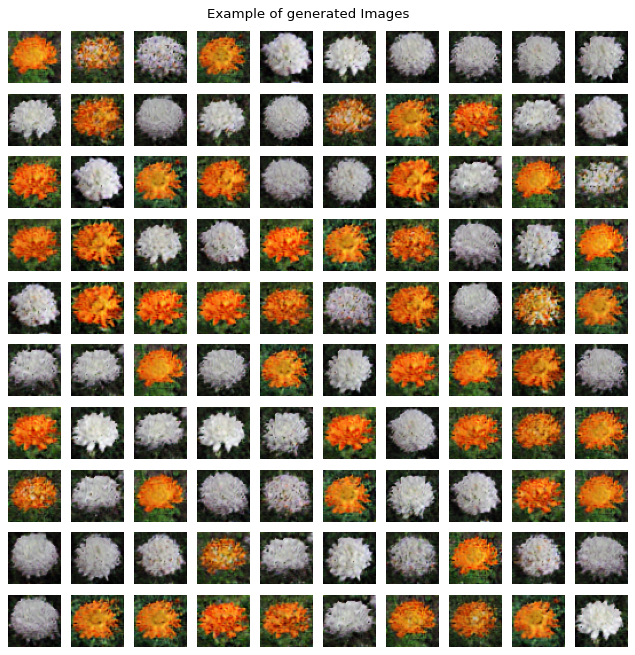

In [20]:
noise = tf.random.normal([100, 100])
fake_img_batch = generator_model(noise, training=False)

fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(10, 10), dpi=80)
plt.suptitle("Example of generated Images", y=0.91)
for i in range(10):
    for j in range(10):
        axes[i][j].imshow(fake_img_batch[i*10+j], cmap="gray")
        axes[i][j].axis('off')

plt.show()